# Super Resolution and Total Variation Denoising

# Super Resolution

The first part of this notebook is very similar to the notebook on Image Enhancement. The only difference is the usage of a downsampling operator, which makes image reconstruction more difficult.

## Libraries

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from numpy import fft
from scipy.optimize import minimize
from utils.utils_SR import psf_fft, A, AT, gaussian_kernel, totvar, grad_totvar
from utils.utils_SR import minimize as utils_minimize

## Helpful functions

The first part of the notebook performs a series of tests, using the solving methods already introduced in the previous notebook: naive solution and regularized solution. Since these test are very repetitive, it's useful to declare the following functions.

In [ ]:
# function to generate a Gaussian blur

def generate_blur(kerlen, sigma, shape, print=False):
  k = gaussian_kernel(kerlen, sigma)
  K = psf_fft(k, kerlen, shape)

  if print:
    plt.subplot(1, 2, 1).imshow(k)
    plt.subplot(1, 2, 2).imshow(np.abs(K))
    plt.show()

  # return kernel and its fft
  return k, K

In [ ]:
# function to apply blur to an image
'''
Parameters:
  - X: image
  - K: matrix representing the kernel
  - sf: sampling factor
'''

def blur_image(X, K, sf, print=False):
  X_blurred = A(X, K, sf)

  if print:
    plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
    plt.title('Original')
    plt.xticks([]), plt.yticks([])
    plt.subplot(122).imshow(X_blurred, cmap='gray', vmin=0, vmax=1)
    plt.title('Blurred')
    plt.xticks([]), plt.yticks([])
    plt.show()

  return X_blurred

In [ ]:
# function to generate and add a Gaussian white noise to an image

def add_noise(X_blurred, sigma, K, sf, print=False):
  np.random.seed(42)
  noise = np.random.normal(size=X_blurred.shape)*sigma
  y = X_blurred + noise
  ATy = AT(y, K, sf)

  if print:
    plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
    plt.title('Original')
    plt.xticks([]), plt.yticks([])
    plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
    plt.title('Downsampled')
    plt.xticks([]), plt.yticks([])
    plt.show()

  return y, ATy

In [ ]:
# function to calculate the naive solution

def naive_solution(ATy, m, n, X, f, df):
  x0 = ATy.reshape(m*n)
  max_iter = 25
  res = minimize(f, x0, method='CG', jac=df, options={'maxiter':max_iter, 'return_all':True})

  PSNR = np.zeros(max_iter + 1)
  MSE = np.zeros(max_iter + 1)
  for k, x_k in enumerate(res.allvecs):
      PSNR[k] = metrics.peak_signal_noise_ratio(X, x_k.reshape(X.shape))
      MSE[k] = metrics.mean_squared_error(X, x_k.reshape(X.shape))

  X_res = res.x.reshape((m, n))

  return X_res, PSNR, MSE

In [ ]:
# function to visualize results of applying the naive method

def visualize_naive_sol(X, ATy, PSNR, MSE):
  starting_PSNR = np.full(PSNR.shape[0], metrics.peak_signal_noise_ratio(X, ATy))
  starting_MSE = np.full(MSE.shape[0], metrics.mean_squared_error(X, ATy))

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
  ax1.plot(PSNR, label="Naive solution")
  ax1.plot(starting_PSNR, label="Corrupted image")
  ax1.legend()
  ax1.set_title('PSNR vs iteration')
  ax1.set_ylabel("PSNR")
  ax1.set_xlabel('itr')
  ax2.plot(MSE, label="Naive solution")
  ax2.plot(starting_MSE, label="Corrupted image")
  ax2.legend()
  ax2.set_title('MSE vs iteration')
  ax2.set_ylabel("MSE")
  ax2.set_xlabel('itr')
  ax3.imshow(X_res, cmap='gray', vmin=0, vmax=1)
  ax3.set_title('Reconstructed image')
  plt.show()

In [ ]:
# function to calculate the regularized solutions for various regularization parameters

def try_lambdas(ATy, m, n, lambdas, f, df):
  x0 = ATy.reshape(m*n)
  PSNRs, MSEs, images = [], [], []

  for i, L in enumerate(lambdas):
      max_iter = 50
      res = minimize(f, x0, (L), method='CG', jac=df, options={'maxiter':max_iter})
      X_curr = res.x.reshape(X.shape)
      images.append(X_curr)

      PSNRs.append(metrics.peak_signal_noise_ratio(X, X_curr))
      MSEs.append(metrics.mean_squared_error(X, X_curr))

  return PSNRs, MSEs, images

In [ ]:
# function to the results of the try_lambdas function

def plot_lambda_results(lambdas, PSNRs, MSEs):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,3))
  ax1.plot(lambdas,PSNRs)
  ax1.set_title('PSNR vs $\lambda$')
  ax1.set_ylabel("PSNR")
  ax1.set_xlabel('$\lambda$')
  ax2.plot(lambdas,MSEs)
  ax2.set_title('MSE vs $\lambda$')
  ax2.set_ylabel("MSE")
  ax2.set_xlabel('$\lambda$')
  plt.show()

In [ ]:
# function to plot the images reconstructed by try_lambdas

def plot_images_obtained(lambdas, images, X, y):
  plt.figure(figsize=(30, 10))
  plt.subplot(1, len(lambdas) + 2, 1).imshow(X, cmap='gray', vmin=0, vmax=1)
  plt.title("Original")
  plt.xticks([]), plt.yticks([])
  plt.subplot(1, len(lambdas) + 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
  plt.title("Corrupted")
  plt.xticks([]), plt.yticks([])
  for i, L in enumerate(lambdas):
    plt.subplot(1, len(lambdas) + 2, i + 3).imshow(images[i], cmap='gray', vmin=0, vmax=1)
    plt.title(f"Reconstruction ($\lambda$ = {L:.3f})")
  plt.show()

In [ ]:
# function to minimize (naive)
def f_naive(x):
    x = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y))

# gradient of function to minimize (naive)
def df_naive(x):
    x = x.reshape((m, n))
    ATAx = AT(A(x,K, sf), K, sf)
    d = ATAx - ATy
    return d.reshape(m * n)

# function to minimize (regularized)
def f_reg(x, L):
    nsq = np.sum(np.square(x))
    x  = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y)) + 0.5 * L * nsq

# gradient of the function to minimize (regularized)
def df_reg(x, L):
    Lx = L * x
    x = x.reshape(m, n)
    ATAx = AT(A(x,K, sf),K, sf)
    d = ATAx - ATy
    return d.reshape(m * n) + Lx

## Tests

The following sections perform a series of tests on the same image. The only parameter that differentiates the tests is the sampling factor.

The goal is to compare the naive method with the one making use of Tikhonov regularization.

In [ ]:
X = data.astronaut()[:, :, 0] / 255
m, n = X.shape

### Test 1

In [ ]:
sf = 2
kerlen = 7
sigma = 0.5

k, K = generate_blur(kerlen, sigma, X.shape)
X_blurred = blur_image(X, K, sf)
y, ATy = add_noise(X_blurred, 0.02, K, sf)

print(f'PSNR of the corrupted image: {metrics.peak_signal_noise_ratio(X, ATy)}')

PSNR of the corrupted image: 26.64214966382783


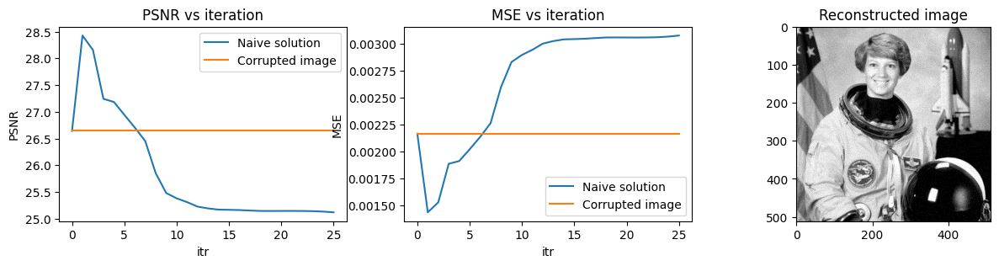

In [ ]:
X_res, PSNR, MSE = naive_solution(ATy, m, n, X, f_naive, df_naive)
visualize_naive_sol(X, ATy, PSNR, MSE)

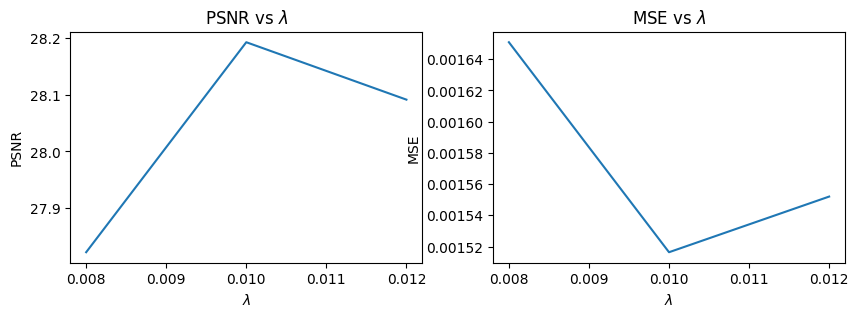

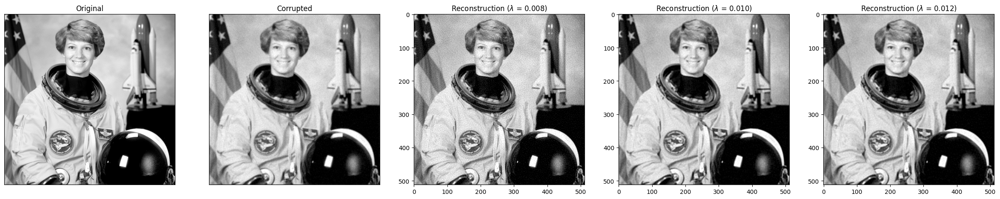

In [ ]:
lambdas = [0.008, 0.01, 0.012]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_reg, df_reg)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

### Test 2

In [ ]:
sf = 4
kerlen = 7
sigma = 0.5

k, K = generate_blur(kerlen, sigma, X.shape)
X_blurred = blur_image(X, K, sf)
y, ATy = add_noise(X_blurred, 0.02, K, sf)

print(f'PSNR of the corrupted image: {metrics.peak_signal_noise_ratio(X, ATy)}')

PSNR of the corrupted image: 23.67073013539196


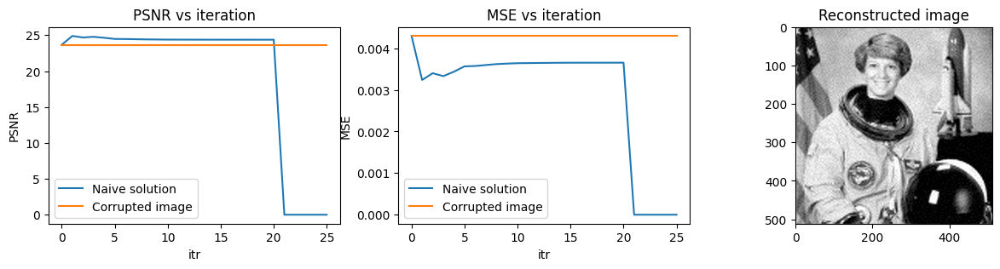

PSNR = [23.67073014 24.8975536  24.68601126 24.77665007 24.63940208 24.48054366
 24.46999578 24.44200501 24.41568335 24.40090014 24.38917119 24.38598177
 24.38279019 24.37934675 24.37738979 24.37561284 24.37540571 24.37510312
 24.37499274 24.37468658 24.37443232  0.          0.          0.
  0.          0.        ], MSE = [0.00429464 0.00323776 0.00339937 0.00332916 0.00343605 0.00356407
 0.00357273 0.00359583 0.00361769 0.00363003 0.00363984 0.00364252
 0.0036452  0.00364809 0.00364973 0.00365123 0.0036514  0.00365165
 0.00365175 0.003652   0.00365222 0.         0.         0.
 0.         0.        ]


In [ ]:
X_res, PSNR, MSE = naive_solution(ATy, m, n, X, f_naive, df_naive)
visualize_naive_sol(X, ATy, PSNR, MSE)

print(f'PSNR = {PSNR}, MSE = {MSE}')

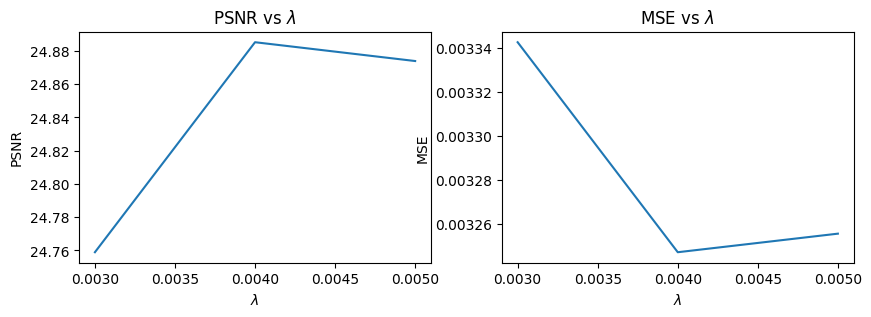

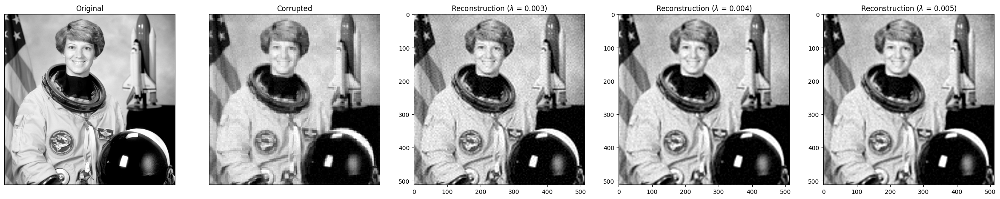

In [ ]:
lambdas = [0.003, 0.004, 0.005]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_reg, df_reg)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

### Test 3

In [ ]:
sf = 8
kerlen = 7
sigma = 0.5

k, K = generate_blur(kerlen, sigma, X.shape)
X_blurred = blur_image(X, K, sf)
y, ATy = add_noise(X_blurred, 0.02, K, sf)

print(f'PSNR of the corrupted image: {metrics.peak_signal_noise_ratio(X, ATy)}')

PSNR of the corrupted image: 20.41524629039651


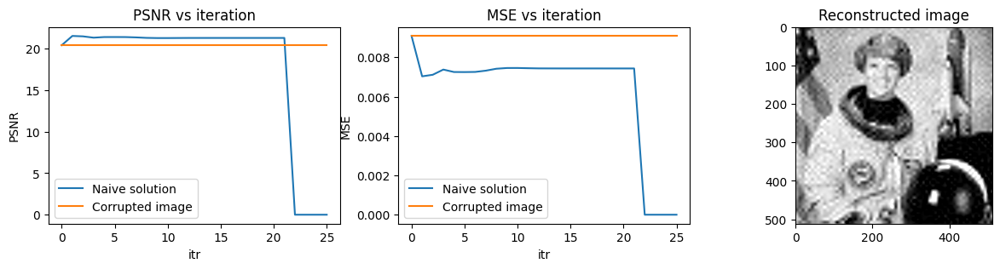

PSNR = [20.41524629 21.52773331 21.47853454 21.32006528 21.39381276 21.3959063
 21.39160401 21.35326922 21.29541525 21.27371323 21.27304869 21.27988596
 21.2852724  21.28609538 21.28660463 21.2867126  21.28660825 21.28659933
 21.28680264 21.28698139 21.28700883 21.28703564  0.          0.
  0.          0.        ], MSE = [0.00908815 0.00703439 0.00711454 0.00737893 0.00725469 0.00725119
 0.00725838 0.00732273 0.00742093 0.00745811 0.00745925 0.00744752
 0.00743828 0.00743687 0.007436   0.00743582 0.007436   0.00743601
 0.00743566 0.00743536 0.00743531 0.00743526 0.         0.
 0.         0.        ]


In [ ]:
X_res, PSNR, MSE = naive_solution(ATy, m, n, X, f_naive, df_naive)
visualize_naive_sol(X, ATy, PSNR, MSE)

print(f'PSNR = {PSNR}, MSE = {MSE}')

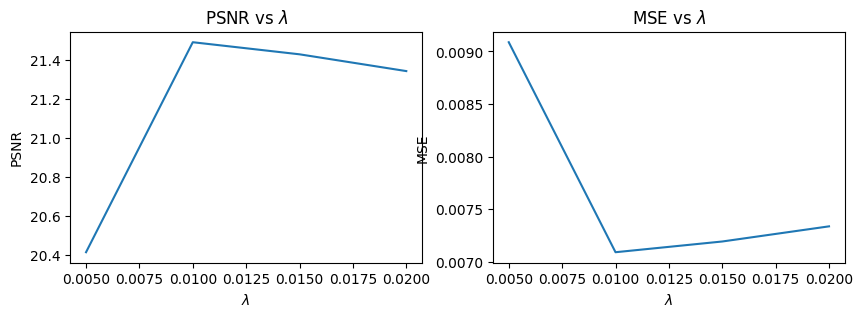

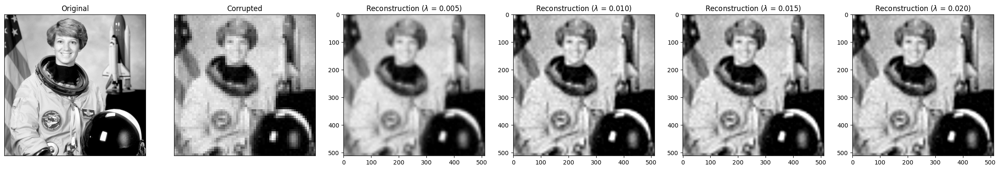

In [ ]:
lambdas = [0.005, 0.01, 0.015, 0.02]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_reg, df_reg)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

# Total Variation

Total variation is a functional that can be employed as a regularization term instead of Tikhonov's one. TV measures the difference between neighbouring pixels and is defined as follows:

$TV(x) =$ $\sum_{i}^{n}$ $\sum_{j}^{m}$ $\sqrt{\left \| \nabla x(i, j) \right \|_2^2  + \epsilon^2}$

The purpose of this section is dual: analysing the behaviour of TV regularization and comparing it to the one of Tikhonov regularization.

As before, various tests are performed using different sampling factors.
The first four tests are performed using the Astronaut image; whereas the last one (Test 5) uses a less detailed image.

## Functions

In [ ]:
# total variation function
def f_tv(x, L):
    reg = totvar(x)
    x  = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y)) + L * reg

# gradient of total variation function
def df_tv(x, L):
    grad_tv = grad_totvar(x)
    x = x.reshape(m, n)
    ATAx = AT(A(x,K, sf),K, sf)
    d = ATAx - ATy
    return d.reshape(m*n) + L * grad_tv.reshape(m*n)

## Test 1 (sf = 1)

### Total Variation (sf = 1)

In [ ]:
sf = 1
kerlen = 5
sigma = 1.3

k, K = generate_blur(kerlen, sigma, X.shape)
X_blurred = blur_image(X, K, sf)
y, ATy = add_noise(X_blurred, 0.05, K, sf)

print(f'PSNR of the corrupted image: {metrics.peak_signal_noise_ratio(X, ATy)}')

PSNR of the corrupted image: 26.09226961822362


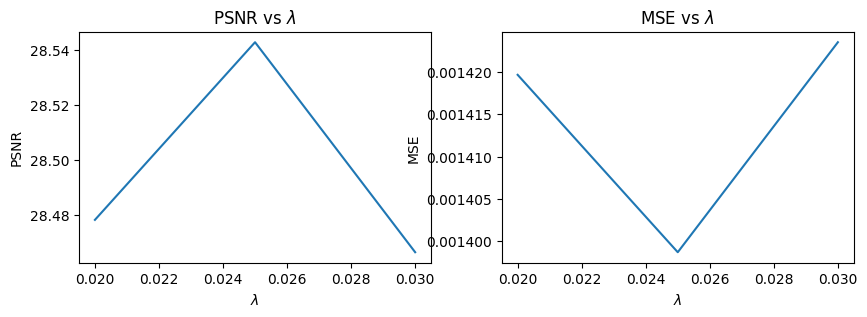

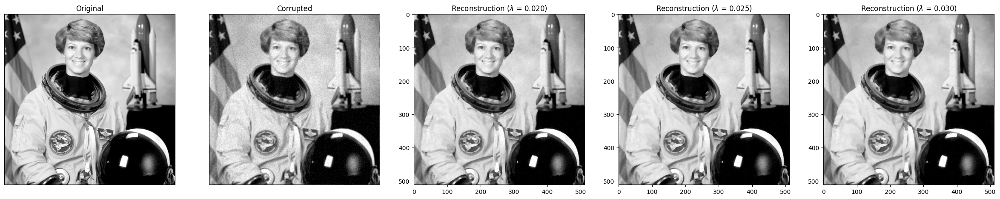

In [ ]:
lambdas = [0.02, 0.025, 0.03]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_tv, df_tv)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

### Regularization (sf = 1)

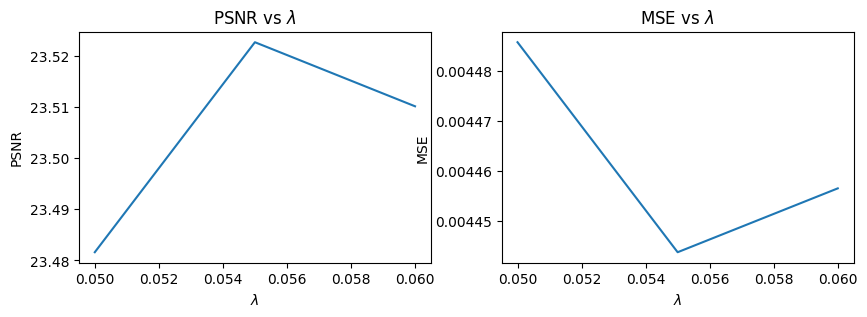

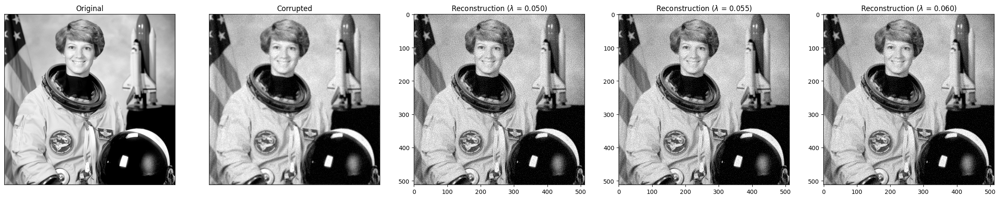

In [ ]:
lambdas = [0.05, 0.055, 0.06]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_reg, df_reg)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

## Test 2 (sf = 2)

### Total Variation (sf = 2)

In [ ]:
sf = 2
kerlen = 5
sigma = 1.3

k, K = generate_blur(kerlen, sigma, X.shape)
X_blurred = blur_image(X, K, sf)
y, ATy = add_noise(X_blurred, 0.02, K, sf)

print(f'PSNR of the corrupted image: {metrics.peak_signal_noise_ratio(X, ATy)}')

PSNR of the corrupted image: 25.164492160100895


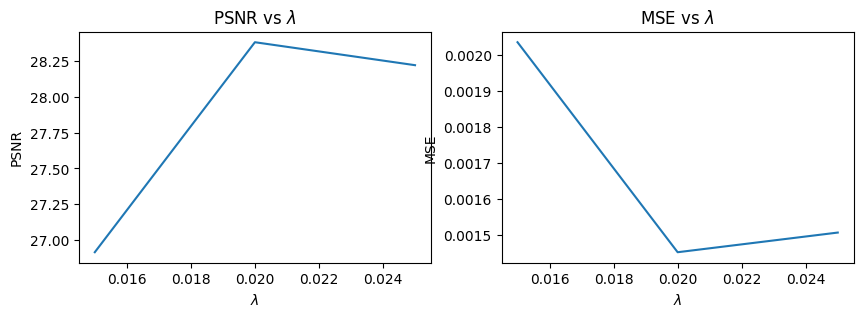

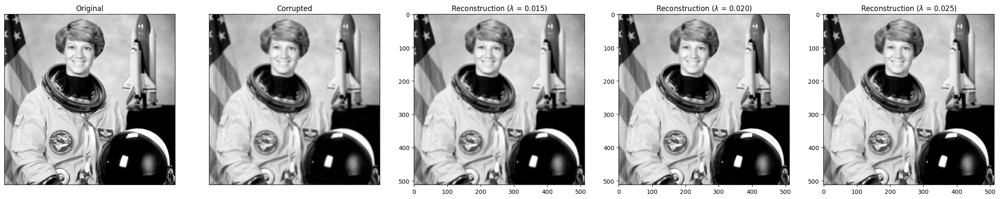

In [ ]:
lambdas = [0.015, 0.02, 0.025]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_tv, df_tv)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

### Regularization (sf = 2)



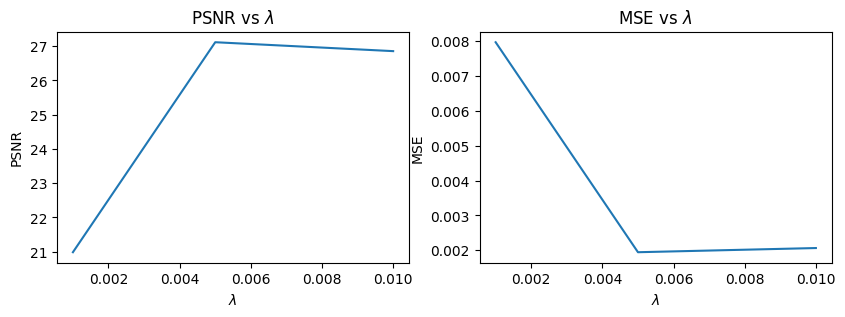

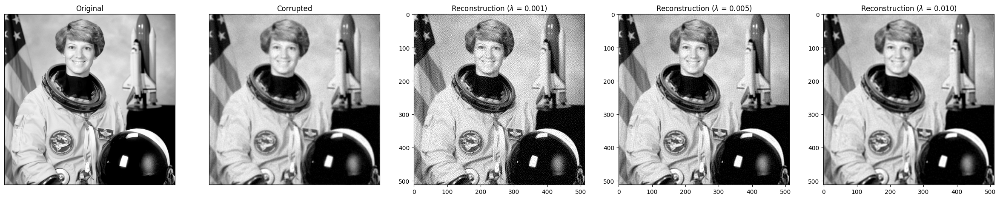

In [ ]:
lambdas = [0.001, 0.005, 0.01]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_reg, df_reg)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

## Test 3 (sf = 4)

### Total Variation (sf = 4)

In [ ]:
sf = 4
kerlen = 5
sigma = 1.3

k, K = generate_blur(kerlen, sigma, X.shape)
X_blurred = blur_image(X, K, sf)
y, ATy = add_noise(X_blurred, 0.02, K, sf)

print(f'PSNR of the corrupted image: {metrics.peak_signal_noise_ratio(X, ATy)}')

PSNR of the corrupted image: 23.122140002596403


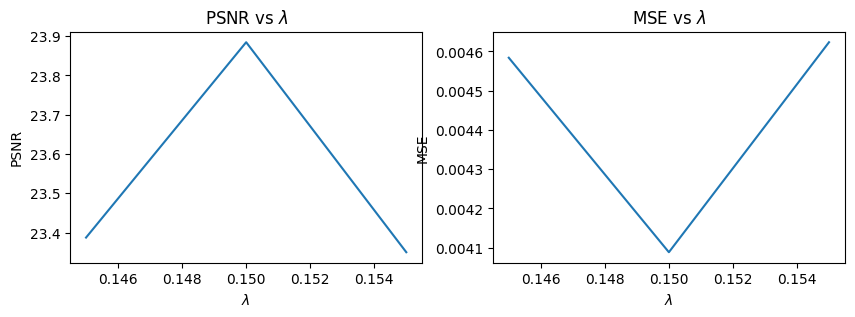

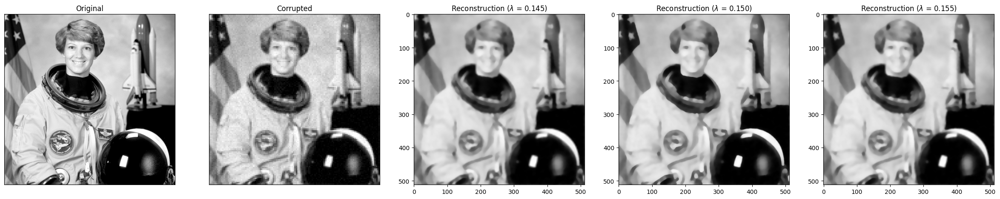

In [ ]:
lambdas = [0.145, 0.15, 0.155]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_tv, df_tv)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

### Regularization (sf = 4)

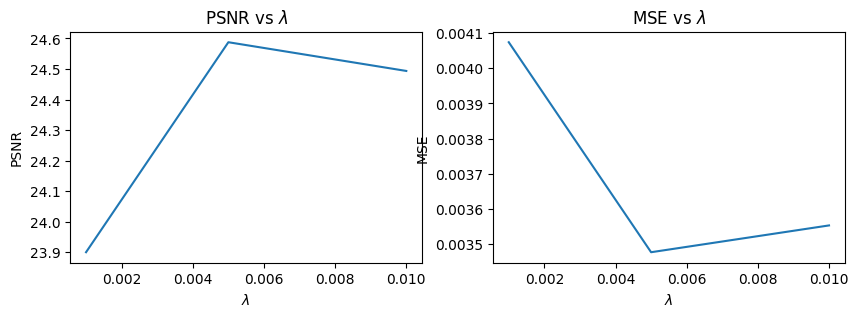

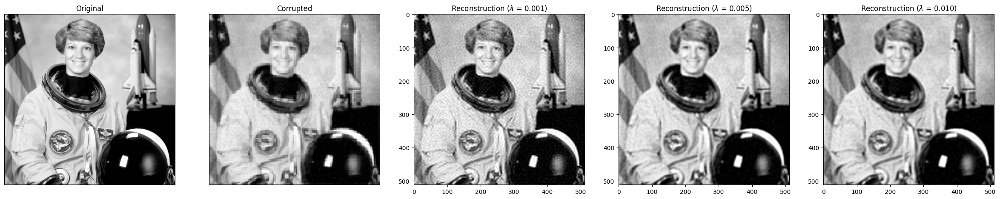

In [ ]:
lambdas = [0.001, 0.005, 0.01]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_reg, df_reg)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

## Test 4 (sf = 8)

### Total Variation (sf = 8)

In [ ]:
sf = 8
kerlen = 5
sigma = 1.3

k, K = generate_blur(kerlen, sigma, X.shape)
X_blurred = blur_image(X, K, sf)
y, ATy = add_noise(X_blurred, 0.02, K, sf)

print(f'PSNR of the corrupted image: {metrics.peak_signal_noise_ratio(X, ATy)}')

PSNR of the corrupted image: 20.263899262862942


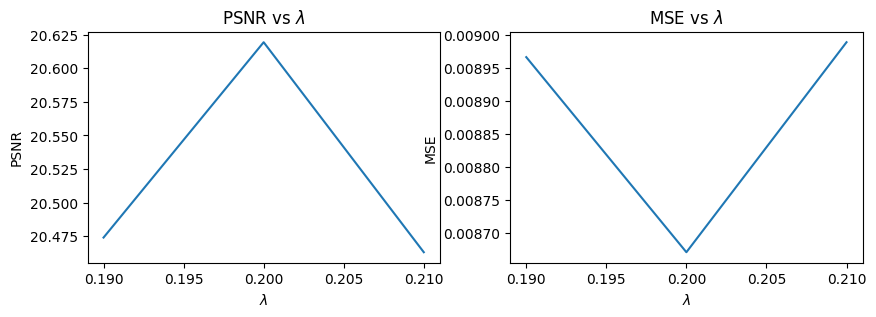

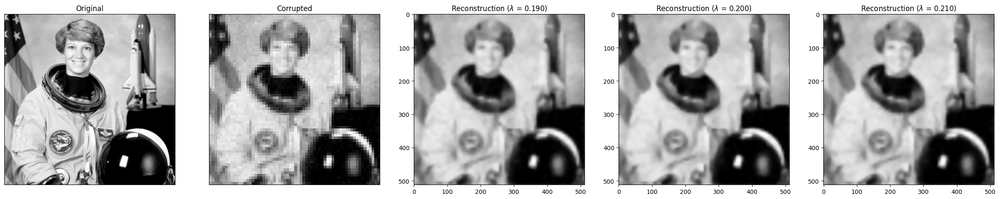

In [ ]:
lambdas = [0.19, 0.2, 0.21]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_tv, df_tv)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

### Regularization (sf = 8)

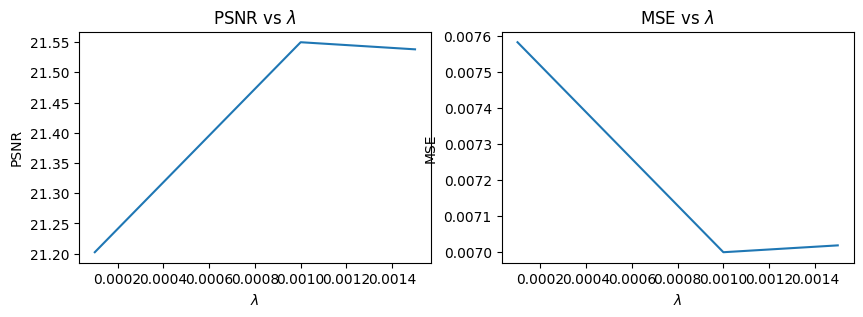

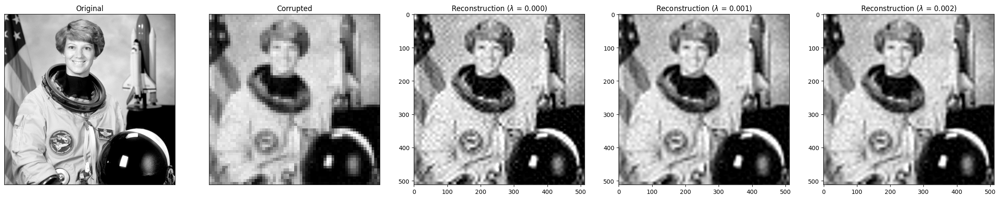

In [ ]:
lambdas = [0.0001, 0.001, 0.0015]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_reg, df_reg)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

## Test 5 (Blobs)

The last test is performed on a different kind of image, one with less details.

### Total Variation (Blobs, sf = 8)

In [ ]:
X = data.binary_blobs().astype(float)
m, n = X.shape

sf = 8
kerlen = 5
sigma = 1.3

k, K = generate_blur(kerlen, sigma, X.shape)
X_blurred = blur_image(X, K, sf)
y, ATy = add_noise(X_blurred, 0.02, K, sf)

print(f'PSNR of the corrupted image: {metrics.peak_signal_noise_ratio(X, ATy)}')

PSNR of the corrupted image: 15.527695781818789


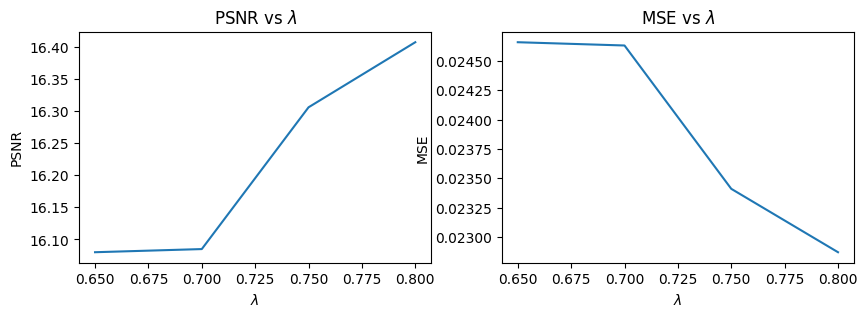

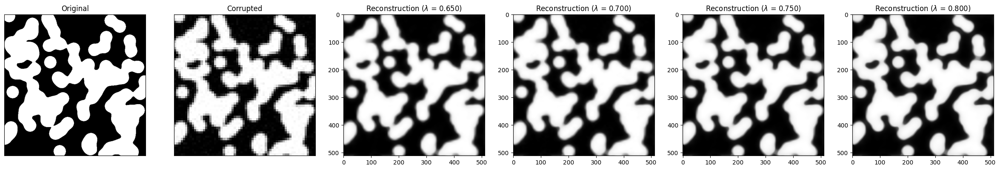

In [ ]:
lambdas = [0.65, 0.7, 0.75, 0.8]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_tv, df_tv)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)

### Regularization (Blobs, sf = 8)

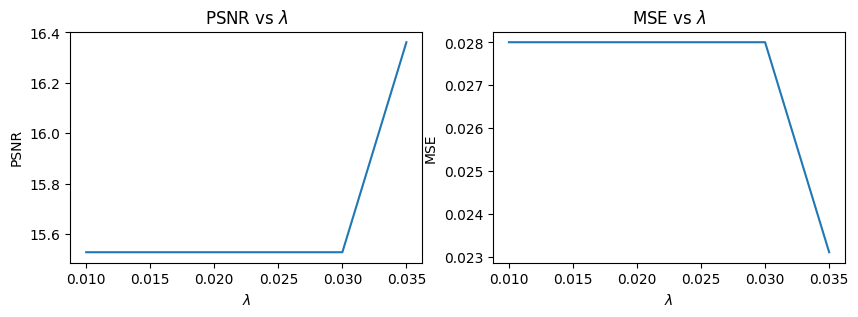

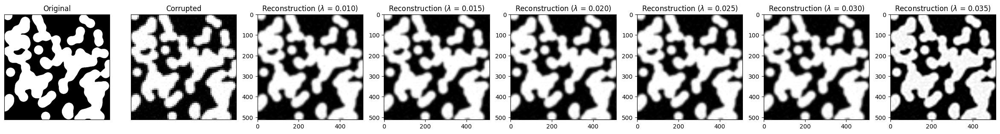

In [ ]:
lambdas = [0.01, 0.015, 0.02, 0.025, 0.03, 0.035]
PSNRs, MSEs, images = try_lambdas(ATy, m, n, lambdas, f_reg, df_reg)
plot_lambda_results(lambdas, PSNRs, MSEs)
plot_images_obtained(lambdas, images, X, y)